In [3]:
from __future__ import division, print_function, absolute_import
###############################################################
import numpy as np
import pandas as pd
from Bio import SeqIO
import pickle
from ripser import ripser
import multiprocessing
from joblib import Parallel, delayed
from tqdm import tqdm
import sys
##########################
import torch
from itertools import groupby
import warnings
from numba import cuda
from gudhi.wasserstein import wasserstein_distance

#####
import simplejson

# 5-D on Influenza data

In [4]:
d = {"A":[1,0,0,0], "G":[0,1,0,0], "C":[0,0,1,0], "T":[0,0,0,1]} ## mapping     

In [5]:
os.getcwd()

'c:\\Users\\letph\\Desktop\\MatlabCode\\Python Code\\5D-Influenza'

In [6]:
os.chdir('c:\\Users\\letph\\Desktop\\MatlabCode\\Python Code\\datasets')

In [7]:
data = []
append = data.append
for record in SeqIO.parse(open('Influenza.fasta'),"fasta"):
    append(list(record.seq))

In [8]:
resR4 = [pd.Series(i).map(d) for i in data]
resR5 = [x + pd.Series([[i + 1] for i in x.index]) for x in resR4]
resR5 = [i[~i.isna()] for i in resR5] # casue there will be abnormal value, like "Y", in some of the DNA sequence
datR5 = [np.array(list(i)) for i in resR5]

In [9]:
seqs = [seq for seq in SeqIO.parse(open("Influenza.fasta"), "fasta")]

In [10]:
os.chdir('c:\\Users\\letph\\Desktop\\MatlabCode\\Python Code\\5D-Influenza')
labels = []
append = labels.append
for i in range(len(seqs)):
    idname = seqs[i].id
    append(idname)
filelabel = open('Label_Influenza.txt', 'w')
simplejson.dump(labels, filelabel)
filelabel.close()

# Persistence Cohomology

In [11]:
import numba as nb
from numba import jit
from numba import njit
from numba import vectorize, float64
from numba import types
from numba.extending import overload_method
from ripser import ripser, Rips
from persim import plot_diagrams

In [12]:
from Persistence import barcode, perDiag

In [13]:
barcodeH0 = barcode(datR5, order = 0)

100%|██████████| 38/38 [01:07<00:00,  1.78s/it]


In [14]:
barcodeH1 = barcode(datR5, order = 1)

100%|██████████| 38/38 [00:52<00:00,  1.39s/it]


In [15]:
# save the result as pickle object
#with open('5D_Influenza_Diag.data', 'wb') as filehandle:
 #   pickle.dump(Diags, filehandle)

In [16]:
with open('5D_Influenza_DiagH0.data', 'wb') as filehandle:
    pickle.dump(barcodeH0, filehandle)
with open('5D_Influenza_DiagH1.data', 'wb') as filehandle:
       pickle.dump(barcodeH1, filehandle)

# Distance Matrix

In [17]:
import ot

In [18]:
def wasDist(Diags, autodiff = True, device_type = 'cpu'):
    n = len(Diags)
    matrix  = torch.zeros(n, n, dtype = torch.float64,device = device_type)
    for i in range(n - 1):
        for j in range(i+1, n):
            matrix[i,j] = wasserstein_distance(Diags[i],Diags[j], enable_autodiff=autodiff)
    matrix  = matrix + torch.transpose(matrix,0,1) 
    return matrix

In [19]:
with open("5D_Influenza_DiagH0.data", 'rb') as filehandle:
    # read the data as binary data stream
    data = pickle.load(filehandle)

In [20]:
datTensor = [torch.from_numpy(i) for i in data]
deviceType = torch.device('cpu')
datConvert = [i.to(deviceType) for i in datTensor]
distance = wasDist(datConvert, device_type = deviceType)

In [21]:
DistMat = distance.cpu().numpy()

In [22]:
np.savetxt('5D_Influenza_DistanceMatrix.txt', DistMat, delimiter=",")

# Persistence Landscape

In [23]:
from gudhi.representations import Landscape

In [24]:
l = Landscape(num_landscapes=2, resolution=100).fit_transform(barcodeH0)

In [25]:
## function to compute the distance matrix for order p 
@overload_method(types.Array, 'repeat')
def minkowski_distance(landscape, order):
    n = len(landscape)
    distance_matrix = np.zeros((n,n), dtype = np.float64)
    for i in range(n-1):
        for j in range(i+1, n):
            distance_matrix[i,j] = np.linalg.norm( (landscape[i] - landscape[j]),  ord = order)
    distance_matrix = distance_matrix + np.transpose(distance_matrix)
    return distance_matrix

In [26]:
DistanceMatrix_Linf = minkowski_distance(l, order = np.inf)
DistanceMatrix_L2 = minkowski_distance(l, order = 2)

In [27]:
np.savetxt('DistMat_H0_Linf_landscape.txt', DistanceMatrix_Linf, delimiter=",")
np.savetxt('DistMat_H0_L2_landscape.txt', DistanceMatrix_L2, delimiter=",")

# Persistence Diagram Plot

In [42]:
DiagramList = [] 
append =  DiagramList.append
n = len(barcodeH0)
for i in range(n):
    arr1 = barcodeH0[i]
    arr2 = barcodeH1[i] 
    arr = np.concatenate((arr1,arr2), axis = 0)
    append(arr)

In [56]:
import matplotlib.pyplot as plt

In [57]:
rips = Rips()

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


In [58]:
def plotDiagrams(i,k, Diagrams, method = rips):    
    i, k = i,k
    title1 = 'Type ' + str(i)
    title2 = 'Type ' + str(k)
    plt.figure(figsize = (12,6))
    plt.subplot(1,2,1)
    rips.plot(Diagrams[i], show = False)    
    plt.title(title1)
    plt.subplot(1,2,2)
    rips.plot(Diagrams[k], show = False)
    plt.title(title2)
    plt.show()

In [61]:
for i in range(len(labels)):
    num = str(i) 
    labelname = labels[i]
    print(f"Position: ", num, " Name: ", labelname)

Position:  0  Name:  A/turkey/Ontario/FAV110-4/2009(H1N1)
Position:  1  Name:  A/mallard/Nova_Scotia/00088/2010(H1N1)
Position:  2  Name:  A/thick-billed_murre/Canada/1871/2011(H1N1)
Position:  3  Name:  A/duck/Guangxi/030D/2009(H1N1)
Position:  4  Name:  A/mallard/France/691/2002(H1N1)
Position:  5  Name:  A/duck/Hokkaido/w73/2007(H1N1)
Position:  6  Name:  A/pintail/Miyagi/1472/2008(H1N1)
Position:  7  Name:  A/mallard/Korea/KNU_YP09/2009(H1N1)
Position:  8  Name:  A/mallard/Maryland/352/2002(H1N1)
Position:  9  Name:  A/mallard/Maryland/26/2003(H1N1)
Position:  10  Name:  A/dunlin/Alaska/44421-660/2008(H1N1)
Position:  11  Name:  A/mallard/Minnesota/Sg-00620/2008(H1N1)
Position:  12  Name:  A/turkey/Virginia/4135/2014(H1N1)
Position:  13  Name:  A/chicken/Eastern_China/XH222/2008(H5N1)
Position:  14  Name:  A/duck/Eastern_China/JS017/2009(H5N1)
Position:  15  Name:  A/chicken/Yunnan/chuxiong01/2005(H5N1)
Position:  16  Name:  A/chicken/Germany/R3234/2007(H5N1)
Position:  17  Name:  

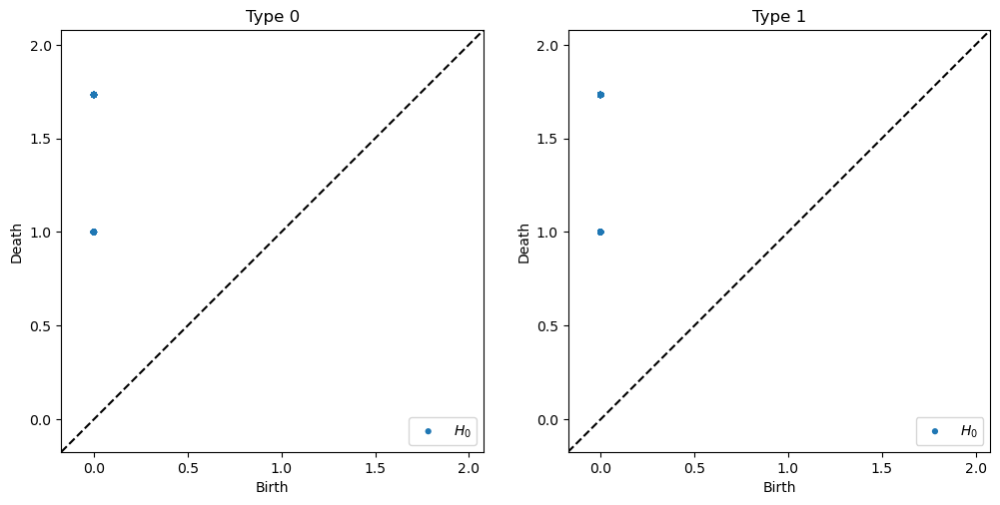

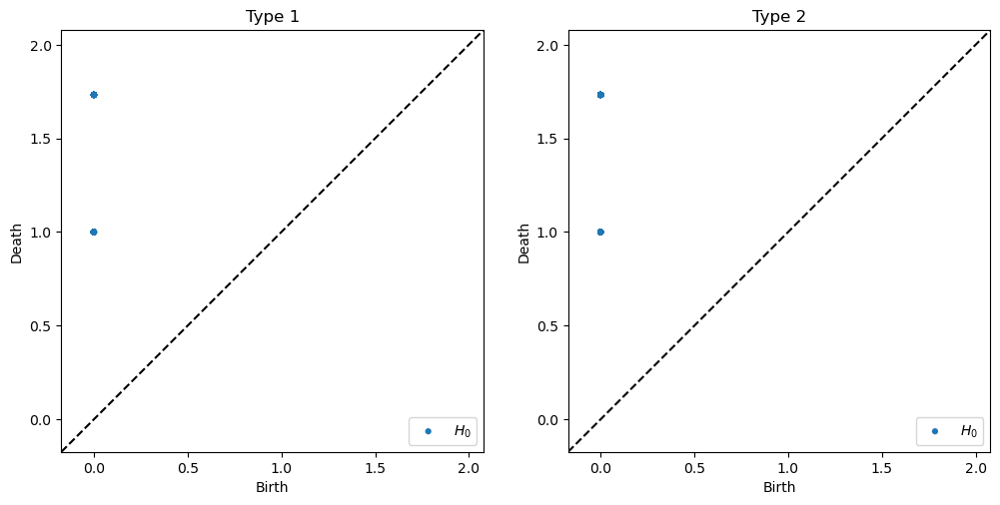

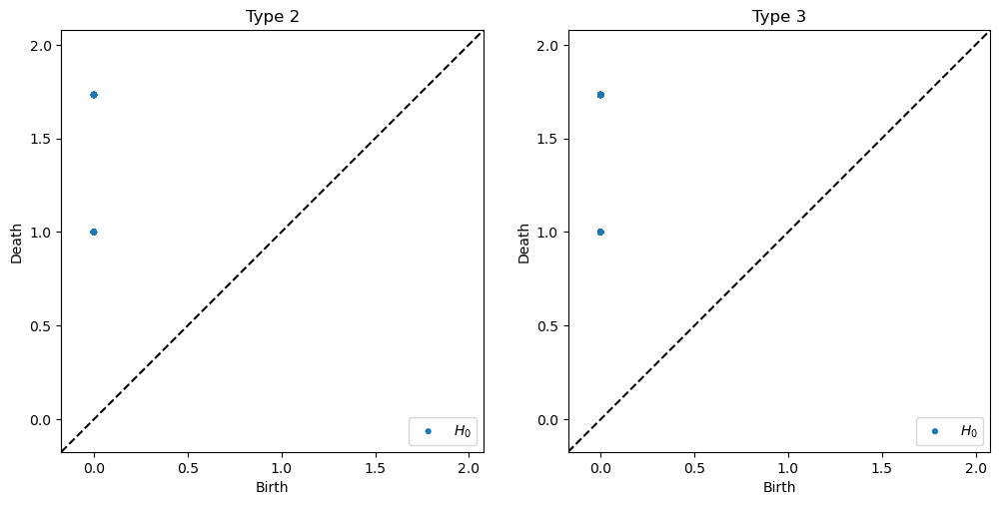

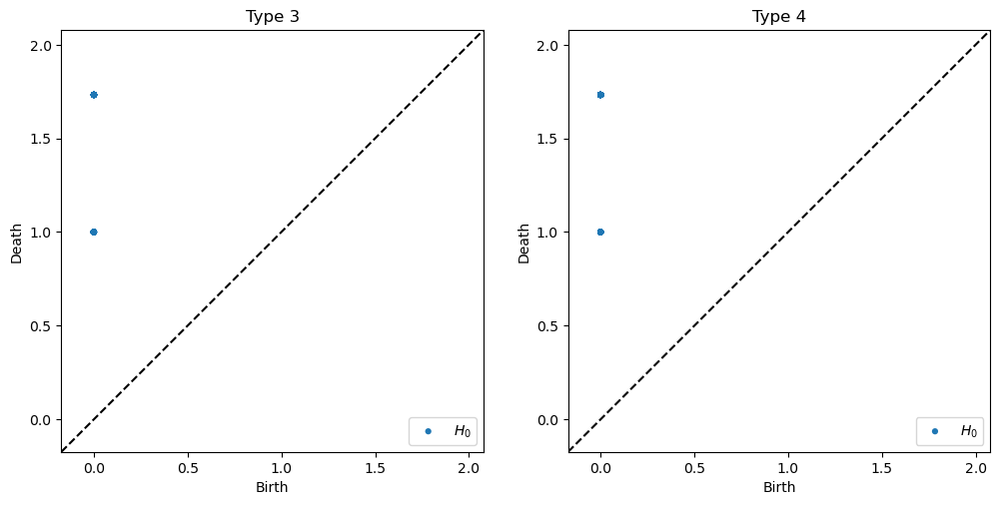

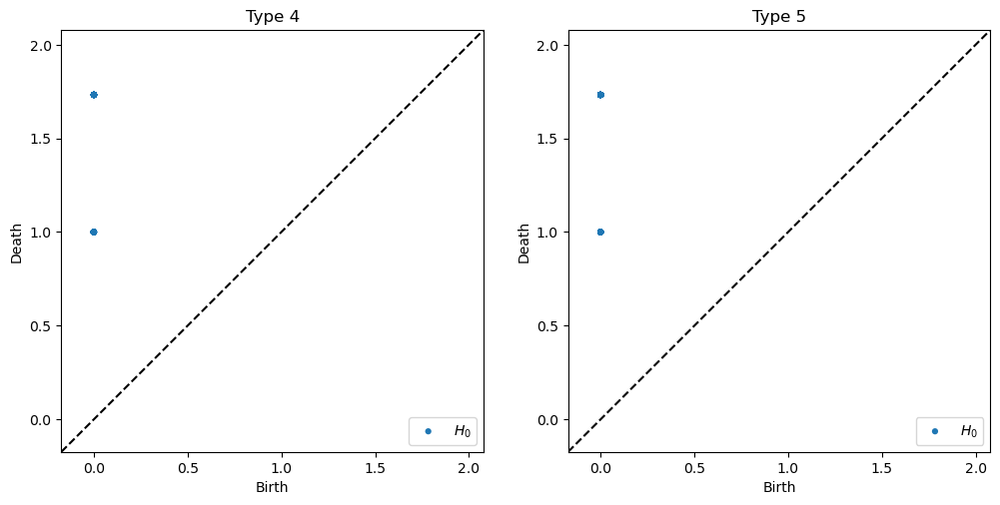

...

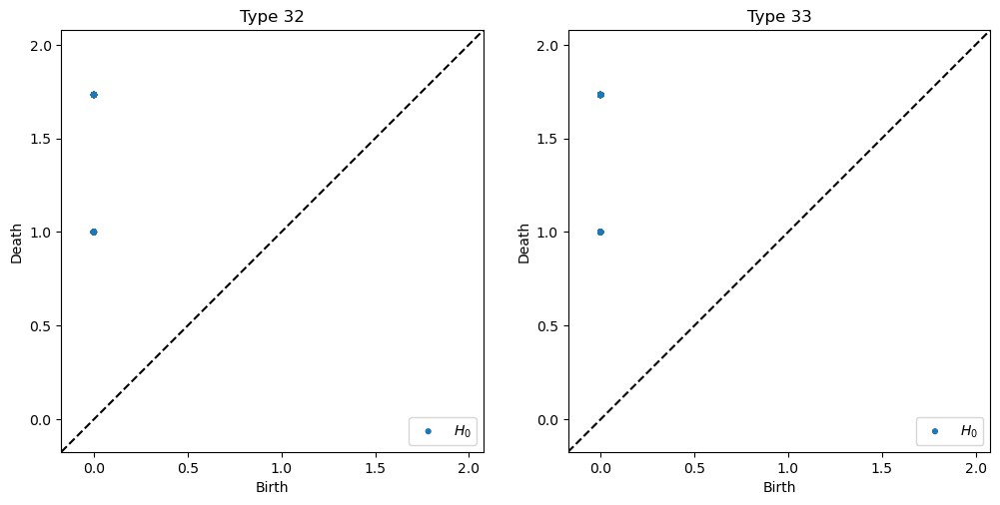

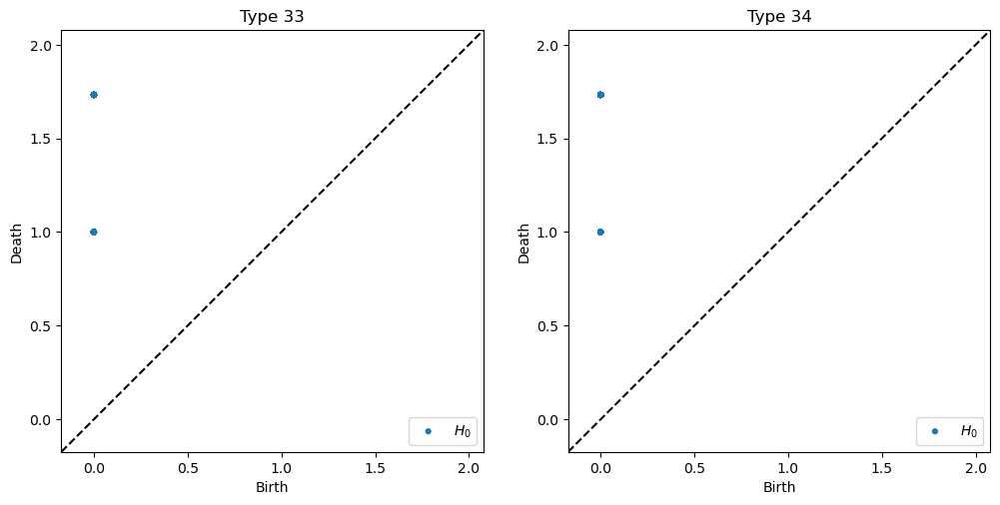

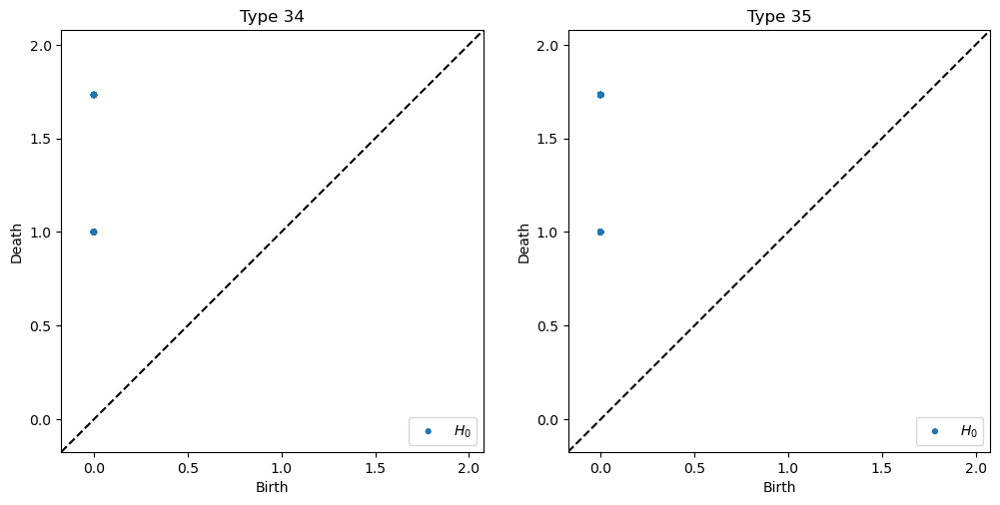

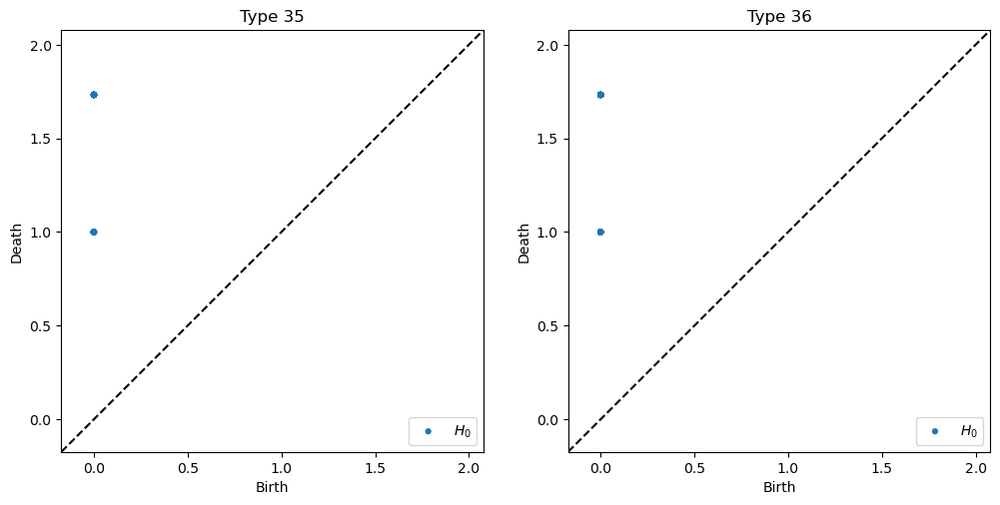

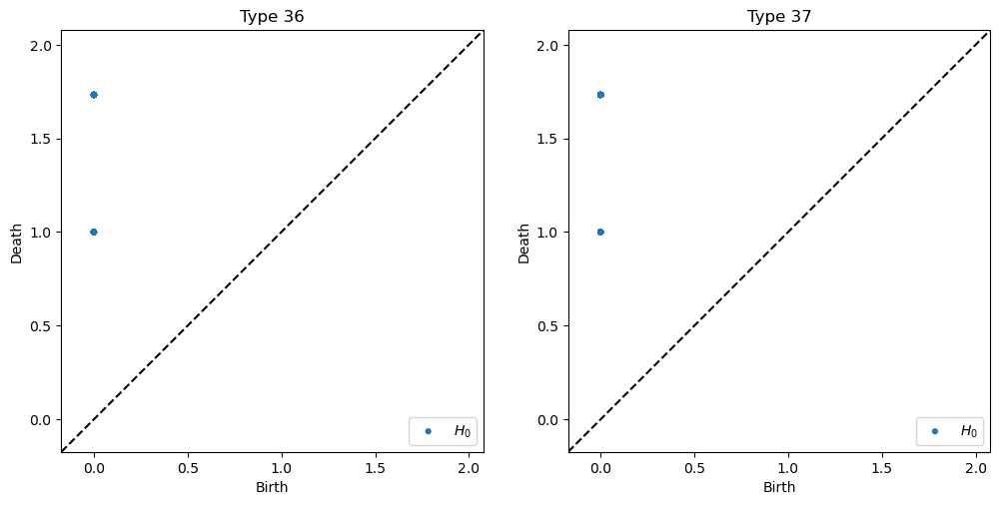

In [63]:
for i in range(1,38):
    plotDiagrams(i-1,i, DiagramList)